In [2]:
# Linear algebra and data handling
import numpy as np
import pandas as pd

# Machine learning
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.model_selection import cross_validate, cross_val_predict, KFold
from sklearn.metrics import mean_absolute_error, median_absolute_error, classification_report
from sklearn.feature_selection import SelectKBest, f_regression, RFE
from sklearn.svm import SVR
from sklearn.preprocessing import (StandardScaler, Normalizer, RobustScaler,
                                    MaxAbsScaler)
from molprop_prediction.scripts.preprocess import *

#Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
sns.set_context('talk', font_scale=1.5)
sns.set(color_codes=True)

#Extension to speed calculation (X10-100)
from sklearnex import patch_sklearn
patch_sklearn() 


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [3]:
x_train = pd.read_csv('/home/onyxia/work/aml_project/data/raw_data/fixed_train_data.csv')
y_train = x_train['y']
x_test = pd.read_csv('/home/onyxia/work/aml_project/data/raw_data/fixed_test_data.csv')
y_test = x_test['y']
x_train =x_train.drop(columns=['y'])
x_test =x_test.drop(columns=['y'])
x_train

,Unnamed: 0,id,smiles
0,122,122,O=C(CCc1cn(Cc2ccc(Cl)cc2)c2ccccc12)Nc1ccncc1
1,1769,1769,COc1ccc(NC(=O)Nc2ccc3c(c2)c2c4c(c5c(c2n3CC(C)C...
2,1220,1220,FC(F)(F)c1cccc(-c2nnc(-c3cccnc3NCc3ccncc3)[nH]...
3,44,44,COc1cc(Nc2ncnc(-c3cccnc3Nc3cccc(C(=O)Nc4ccc(Oc...
4,289,289,COc1cc2c(Nc3ccc(Cl)c(Cl)c3)ncnc2cc1OCc1csc(N2C...
...,...,...,...
3515,3444,3444,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)N1C3=C(C4C...
3516,466,466,CNCc1cncc(-c2cnc3[nH]nc(-c4nc5ccc(OC(F)(F)F)cc...
3517,3092,3092,Cc1ccc(Nc2ncnn3cc(OCCCN4CCCCC4)c(C(C)C)c23)cc1O
3518,3772,3772,C=c1nns/c1=c1\[nH][nH]c(=O)c1=Cc1cn(C)c2ccc(Cl...


In [4]:
new_train = create_our_dataset(x_train, 'smiles', 'mol', n = 8)
new_test = create_our_dataset(x_test, 'smiles', 'mol', n = 8)

[13:00:41] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-310/rdkit/Code/GraphMol/Descriptors/Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
----------
Stacktrace:
----------
****

[13:00:41] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-310/rdkit/Code/GraphMol/Descriptors/Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
----------
Stacktrace:
----------
****

[13:00:41] 

****
Pre-condition Violation
bad result vector size
Violation occurred on line 40 in file /project/build/temp.linux-x86_64-cpython-310/rdkit/Code/GraphMol/Descriptors/Crippen.cpp
Failed Expression: logpContribs.size() == mol.getNumAtoms() && mrContribs.size() == mol.getNumAtoms()
----------
Stacktrace:
----------
****

In [5]:
from sklearn.feature_selection import SelectKBest, chi2

from sklearnex import patch_sklearn
patch_sklearn() 

transformer = RobustScaler().fit(new_train)
x_train_scaled=transformer.transform(new_train)
x_test_scaled=transformer.transform(new_test)


k_best = SelectKBest( k=400)
X_train_selected = k_best.fit_transform(x_train_scaled, y_train)
X_test_selected = k_best.transform(x_test_scaled)

regr = RandomForestRegressor(n_estimators = 100, 
                             max_depth = 30,
                             min_samples_split=2, 
                             min_samples_leaf= 1, 
                             warm_start = False, 
                             bootstrap = False,
                             max_features='sqrt',
                             n_jobs=-1)
regr.fit(X_train_selected, y_train)
y_train_predict= regr.predict(X_train_selected)
y_test_predict= regr.predict(X_test_selected)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


/opt/mamba/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [   9   20   22   47  162  191  324  370  396  417  419  673  686  779
  802  818  833  880  894  942 1010 1062 1081 1120 1130 1330 1379 1383
 1391 1537 1544 1554 1599 1705 1783 1790 1936 1990 2014 2063 2114 2127
 2172 2201 2202 2203 2205 2207 2208 2209 2219 2220 2223 2230 2237 2238
 2242 2244 2251 2253] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/opt/mamba/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw
/opt/mamba/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


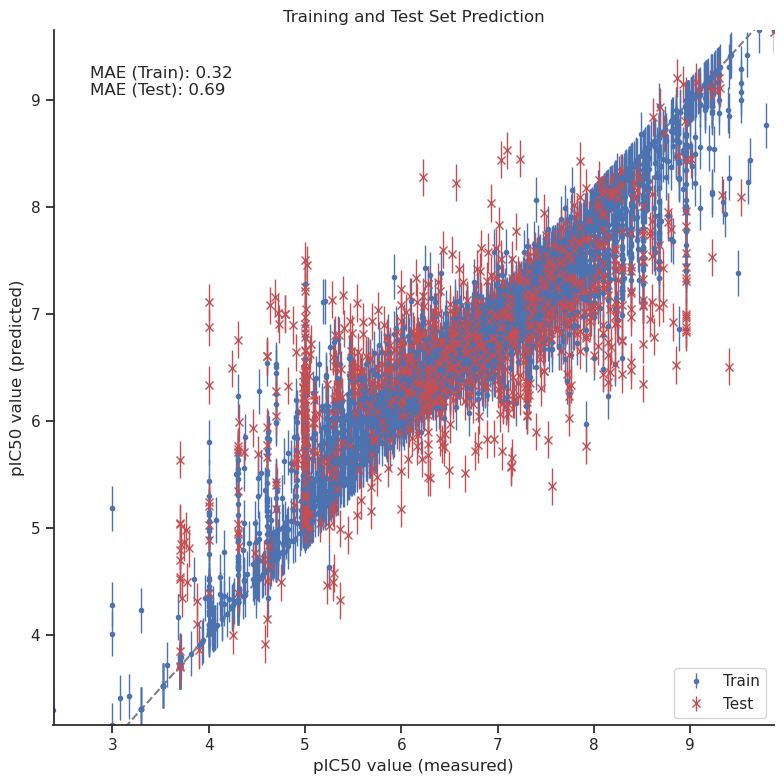

In [5]:
with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(8, 8))

    ax.set_xlim([np.min(y_train), np.max(y_train)])
    ax.set_ylim([np.min(y_train_predict), np.max(y_train_predict)])

    ax.errorbar(y_train, y_train_predict, fmt='.', label='Train', lw=1., capsize=0, yerr=0.2*y_train_predict.std())
    ax.errorbar(y_test, y_test_predict, fmt='x', color='r', markeredgewidth=1., label='Test', lw=1., capsize=0, yerr=0.2*y_test_predict.std())

    ax.plot([-50, 110], [-50, 110], '--', zorder=0, color='gray')

    mae_train = mean_absolute_error(y_train, y_train_predict)
    mae_test = mean_absolute_error(y_test, y_test_predict)

    ax.set_title('Training and Test Set Prediction')
    ax.set_ylabel('pIC50 value (predicted)')
    ax.set_xlabel('pIC50 value (measured)')

    text = ('MAE (Train): {:.2f}'.format(mae_train) + '\n' +
            'MAE (Test): {:.2f}'.format(mae_test))

    ax.text(0.05, 0.95, text, transform=ax.transAxes, ha='left', va='top')
    
    ax.legend(loc='lower right')

    sns.despine()
    fig.tight_layout()
    
    #fig.savefig('y_prediction.png', transparent=True)


In [10]:
X_train_selected_df = pd.DataFrame(X_train_selected)
X_test_selected_df = pd.DataFrame(X_test_selected)

In [12]:
X_train_selected = pd.concat([X_train_selected_df, y_train], axis=1)
X_test_selected = pd.concat([X_test_selected_df, y_test], axis=1)
X_train_selected.to_csv('/home/onyxia/work/aml_project/data/raw_data/tabular_data_train.csv', index=False)
X_test_selected.to_csv('/home/onyxia/work/aml_project/data/raw_data/tabular_data_test.csv', index=False)